In [1]:
from __future__ import absolute_import,division,print_function,unicode_literals
#importing the necessary libraries and dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import sys

# Add the directory containing the Python file to the `sys.path` list
sys.path.append("/IMP_DOCUMENT/College material/SEM6/AIProject/Ozone-Prediction-AIProject/Support")

# Import the Python file
import LSTM_Model
import TsPreProcessing

In [3]:
data = pd.read_csv('PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv')
data.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [6]:
from datetime import datetime
def convert_to_date(x):
  return datetime.strptime(x, '%Y %m %d %H')

aq_df = pd.read_csv('PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv',parse_dates = [['year','month','day','hour']],date_parser=convert_to_date,keep_date_col = True)
aq_df.head()

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [7]:
aq_df.drop(['No','year','month','day','hour'],axis = 1,inplace = True)

In [8]:
aq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   year_month_day_hour  35064 non-null  datetime64[ns]
 1   PM2.5                34285 non-null  float64       
 2   PM10                 34408 non-null  float64       
 3   SO2                  34334 non-null  float64       
 4   NO2                  33830 non-null  float64       
 5   CO                   33052 non-null  float64       
 6   O3                   33850 non-null  float64       
 7   TEMP                 35011 non-null  float64       
 8   PRES                 35014 non-null  float64       
 9   DEWP                 35011 non-null  float64       
 10  RAIN                 35013 non-null  float64       
 11  wd                   34924 non-null  object        
 12  WSPM                 35021 non-null  float64       
 13  station              35064 non-

In [34]:
aq_df['year_month_day_hour'].min(), aq_df['year_month_day_hour'].max()


(Timestamp('2013-03-01 00:00:00'), Timestamp('2017-02-28 23:00:00'))

In [9]:
# Convert the date column to datetime
df = aq_df.copy()
# datae
df['year_month_day_hour'].min(), df['year_month_day_hour'].max()
df = df.set_index('year_month_day_hour')
# df.drop(['From Date'], axis=1, inplace=True)
df.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,
2013-03-01 00:00:00,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35064 entries, 2013-03-01 00:00:00 to 2017-02-28 23:00:00
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   PM2.5    34285 non-null  float64
 1   PM10     34408 non-null  float64
 2   SO2      34334 non-null  float64
 3   NO2      33830 non-null  float64
 4   CO       33052 non-null  float64
 5   O3       33850 non-null  float64
 6   TEMP     35011 non-null  float64
 7   PRES     35014 non-null  float64
 8   DEWP     35011 non-null  float64
 9   RAIN     35013 non-null  float64
 10  wd       34924 non-null  object 
 11  WSPM     35021 non-null  float64
 12  station  35064 non-null  object 
dtypes: float64(11), object(2)
memory usage: 3.7+ MB


In [14]:
df['wd'].value_counts()

NNW    4776
NW     3838
N      3777
WNW    2877
ESE    2786
E      2427
NNE    1919
SSE    1853
SE     1823
NE     1721
S      1700
W      1412
ENE    1305
SSW    1126
SW      880
WSW     704
Name: wd, dtype: int64

In [15]:
# label encoding the wind direction
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['wd'] = le.fit_transform(df['wd'])
df.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,
2013-03-01 00:00:00,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,0,0.5,Dingling
2013-03-01 01:00:00,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,1,0.7,Dingling
2013-03-01 02:00:00,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,1,0.2,Dingling
2013-03-01 03:00:00,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,5,1.0,Dingling
2013-03-01 04:00:00,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,3,2.1,Dingling


In [16]:
df.drop('station',axis = 1,inplace = True)
df.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM
year_month_day_hour,,,,,,,,,,,,
2013-03-01 00:00:00,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,0,0.5
2013-03-01 01:00:00,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,1,0.7
2013-03-01 02:00:00,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,1,0.2
2013-03-01 03:00:00,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,5,1.0
2013-03-01 04:00:00,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,3,2.1


In [19]:
# df.drop(['Temp'], axis=1, inplace=True)
num_cols = df.columns
num_cols

Index(['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'wd', 'WSPM'],
      dtype='object')

In [20]:
df = df.replace('None', np.nan)
# iterate through the columns and convert to float
for col in num_cols:
    df[col] = df[col].astype(float)


In [22]:
df['wd'] = df['wd'].astype('category')
df['wd'].dtype

CategoricalDtype(categories=[ 0.0,  1.0,  2.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0,  9.0,
                  10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0],
, ordered=False)

In [23]:
print("Rows  :  ",df.shape[0])
print("Columns : ",df.shape[1])
print("\nFeatures : \n",df.columns.tolist())

Rows  :   35064
Columns :  12

Features : 
 ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM']


In [24]:

print("\nMissing values : \n",df.isnull().any())


Missing values : 
 PM2.5     True
PM10      True
SO2       True
NO2       True
CO        True
O3        True
TEMP      True
PRES      True
DEWP      True
RAIN      True
wd       False
WSPM      True
dtype: bool


In [25]:
print("\nUnique values : \n",df.nunique())


Unique values : 
 PM2.5    486
PM10     554
SO2      327
NO2      636
CO       103
O3       792
TEMP     998
PRES     593
DEWP     602
RAIN     116
wd        17
WSPM      95
dtype: int64


# Visualizing The Data for Beijing Dingling Station

In [27]:
oz_data = df['O3']
oz_data.head()

year_month_day_hour
2013-03-01 00:00:00    82.0
2013-03-01 01:00:00    80.0
2013-03-01 02:00:00    79.0
2013-03-01 03:00:00    79.0
2013-03-01 04:00:00    81.0
Name: O3, dtype: float64

<AxesSubplot:xlabel='year_month_day_hour'>

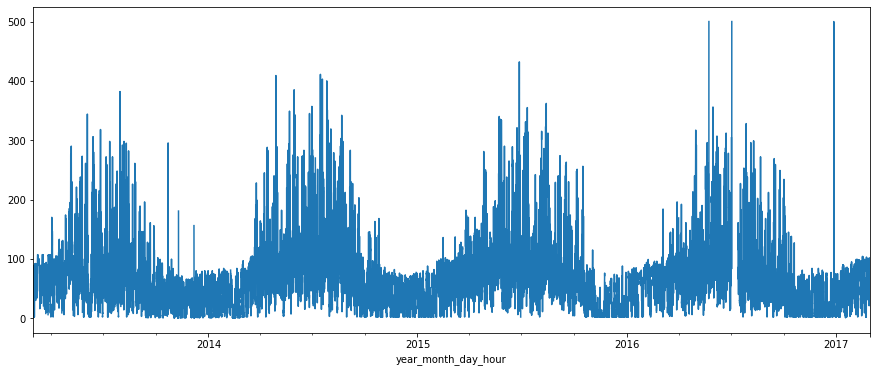

In [28]:
oz_data.plot(figsize=(15, 6))

In [29]:
import plotly.express as px
fig = px.line(oz_data, x=oz_data.index, y=oz_data.values, title='Ozone Concentration')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

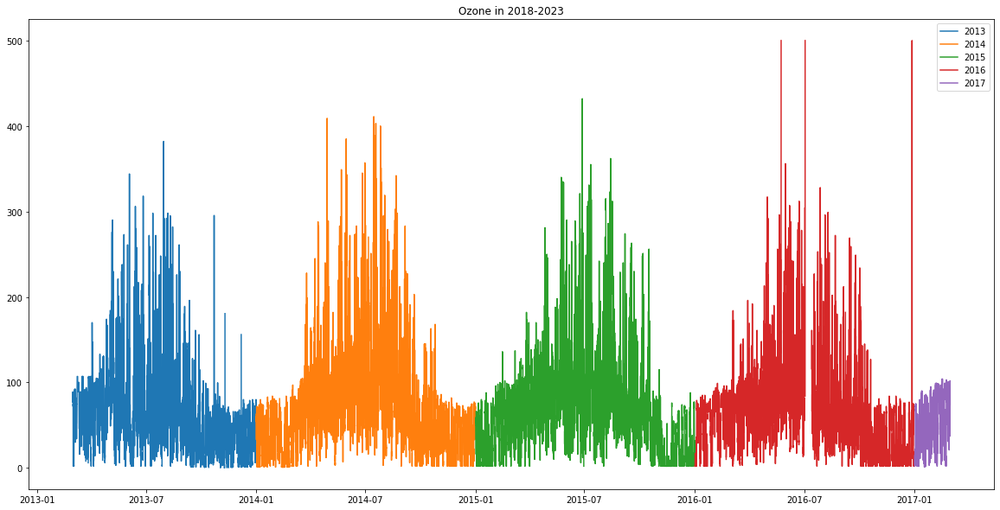

In [35]:

year = [ '2013', '2014', '2015', '2016', '2017']
# all plots in one figure
plt.figure(figsize=(20,10))
for i in year:
    df_year = df.loc[i]
    plt.plot(df_year['O3'],label=i)
plt.legend(loc='best')
plt.title('Ozone in 2018-2023')
plt.show()

In [36]:
# i want to group by month
aq_df = df.copy()
aq_df['month'] = df.index.month
aq_df['year'] = df.index.year
aq_df['day'] = df.index.day
aq_df.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,month,year,day
year_month_day_hour,,,,,,,,,,,,,,,
2013-03-01 00:00:00,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,0.0,0.5,3,2013,1
2013-03-01 01:00:00,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,1.0,0.7,3,2013,1
2013-03-01 02:00:00,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,1.0,0.2,3,2013,1
2013-03-01 03:00:00,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,5.0,1.0,3,2013,1
2013-03-01 04:00:00,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,3.0,2.1,3,2013,1


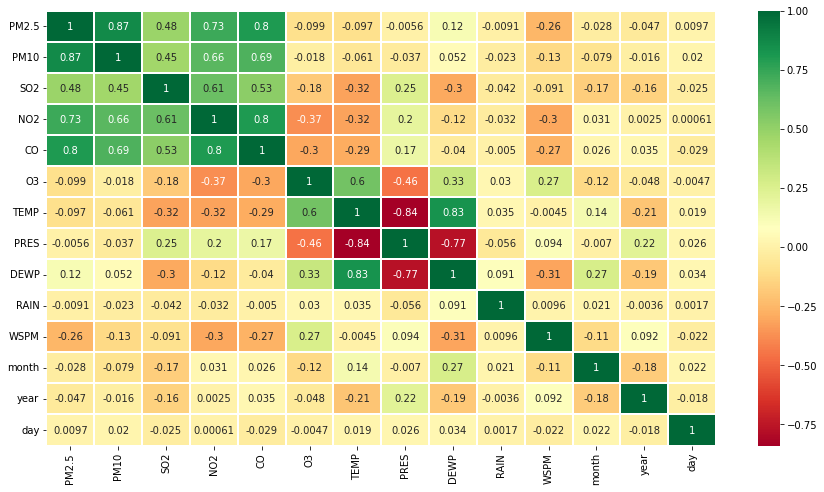

In [37]:
aq_df.dropna(inplace=True)
aq_corr = aq_df.corr(method='pearson')
g = sns.heatmap(aq_corr,annot=True,cmap='RdYlGn',linewidths=0.2)
fig = plt.gcf()
fig.set_size_inches(15,8)
plt.show()

# LSTM Model Training for Ashok Vihar

In [38]:
# dropping the null values
aq_df.dropna(inplace=True)
aq_df.isnull().sum()

PM2.5    0
PM10     0
SO2      0
NO2      0
CO       0
O3       0
TEMP     0
PRES     0
DEWP     0
RAIN     0
wd       0
WSPM     0
month    0
year     0
day      0
dtype: int64

In [39]:
aq_df.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,month,year,day
year_month_day_hour,,,,,,,,,,,,,,,
2013-03-01 02:00:00,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,1.0,0.2,3,2013,1
2013-03-01 05:00:00,6.0,6.0,3.0,4.0,200.0,79.0,-4.5,1022.6,-19.5,0.0,6.0,1.7,3,2013,1
2013-03-01 06:00:00,5.0,10.0,3.0,4.0,200.0,77.0,-4.5,1023.4,-19.5,0.0,6.0,1.8,3,2013,1
2013-03-01 07:00:00,5.0,6.0,3.0,2.0,200.0,80.0,-2.1,1024.6,-20.0,0.0,7.0,2.5,3,2013,1
2013-03-01 08:00:00,8.0,7.0,3.0,3.0,200.0,79.0,-0.2,1025.2,-20.5,0.0,6.0,2.8,3,2013,1


In [41]:
# define the train and test data as 80% and 20% respectively
x_train = aq_df[ : int(0.8*len(aq_df))]
x_test = aq_df[int(0.8*len(aq_df)) : ]
y_train = aq_df['O3'][ : int(0.8*len(aq_df))]
y_test = aq_df['O3'][int(0.8*len(aq_df)) : ]

print("x_train : ",x_train.shape)
print("x_test : ",x_test.shape)
print("y_train : ",y_train.shape)
print("y_test : ",y_test.shape)


x_train :  (25119, 15)
x_test :  (6280, 15)
y_train :  (25119,)
y_test :  (6280,)


In [43]:
# transforming and normalizing the data
train_norm = TsPreProcessing.Transform_Normalize(x_train['O3'])
test_norm = TsPreProcessing.Transform_Normalize(x_test['O3'])

[0.18246501]
[0.18246501]
[0.17783308]
[0.18478097]
[0.18246501]
Number of null values in norm =  1
[0.33867735]
[0.35470942]
[0.34869739]
[0.35671343]
[0.33466934]
Number of null values in norm =  3


In [56]:
print(train_norm.shape)
print(test_norm.shape)

(25118,)
(6277,)


In [57]:
n_steps = 24 #number of steps to look back
X_split_train, y_split_train = TsPreProcessing.split_sequence(train_norm, n_steps)
for i in range(len(X_split_train)):
    print(X_split_train[i], y_split_train[i])
n_features = 1 #number of features (in this case it is just the number of columns in the dataframe)
X_split_train = X_split_train.reshape((X_split_train.shape[0], X_split_train.shape[1], n_features))

[0.18246501 0.18246501 0.17783308 0.18478097 0.18246501 0.18709694
 0.19404483 0.16625327 0.17088519 0.17320116 0.08287859 0.0133997
 0.01108374 0.00413585 0.00876777 0.01803163 0.02729548 0.04582318
 0.09677437 0.09909034 0.07361474 0.10372226 0.09909034 0.08982648] 0.07593070452988496
[0.18246501 0.17783308 0.18478097 0.18246501 0.18709694 0.19404483
 0.16625327 0.17088519 0.17320116 0.08287859 0.0133997  0.01108374
 0.00413585 0.00876777 0.01803163 0.02729548 0.04582318 0.09677437
 0.09909034 0.07361474 0.10372226 0.09909034 0.08982648 0.0759307 ] 0.062034925650635106
[0.17783308 0.18478097 0.18246501 0.18709694 0.19404483 0.16625327
 0.17088519 0.17320116 0.08287859 0.0133997  0.01108374 0.00413585
 0.00876777 0.01803163 0.02729548 0.04582318 0.09677437 0.09909034
 0.07361474 0.10372226 0.09909034 0.08982648 0.0759307  0.06203493] 0.043507220478301974
[0.18478097 0.18246501 0.18709694 0.19404483 0.16625327 0.17088519
 0.17320116 0.08287859 0.0133997  0.01108374 0.00413585 0.0087677

In [58]:
X_split_test, y_split_test = TsPreProcessing.split_sequence(test_norm, n_steps)
for i in range(5):
    print(X_split_test[i], y_split_test[i])
n_features = 1
X_split_test = X_split_test.reshape((X_split_test.shape[0], X_split_test.shape[1], n_features))


[0.33867735 0.35470942 0.34869739 0.35671343 0.33466934 0.29859719
 0.26052104 0.25250501 0.20841683 0.18436874 0.17034068 0.14629259
 0.12625251 0.09619238 0.09218437 0.1002004  0.0741483  0.08817635
 0.10420842 0.09819639 0.15631263 0.17034068 0.15831663 0.13426854] 0.156312625250501
[0.35470942 0.34869739 0.35671343 0.33466934 0.29859719 0.26052104
 0.25250501 0.20841683 0.18436874 0.17034068 0.14629259 0.12625251
 0.09619238 0.09218437 0.1002004  0.0741483  0.08817635 0.10420842
 0.09819639 0.15631263 0.17034068 0.15831663 0.13426854 0.15631263] 0.1783567134268537
[0.34869739 0.35671343 0.33466934 0.29859719 0.26052104 0.25250501
 0.20841683 0.18436874 0.17034068 0.14629259 0.12625251 0.09619238
 0.09218437 0.1002004  0.0741483  0.08817635 0.10420842 0.09819639
 0.15631263 0.17034068 0.15831663 0.13426854 0.15631263 0.17835671] 0.1843687374749499
[0.35671343 0.33466934 0.29859719 0.26052104 0.25250501 0.20841683
 0.18436874 0.17034068 0.14629259 0.12625251 0.09619238 0.09218437
 0.

In [59]:
# import the fucntion for Support folder from the same directory
from LSTM_Model import build_lstm_model
n_steps = 24
n_features = 1
input_shape = (n_steps, n_features)
num_lstm_units = 64
num_hidden_layers = 2
num_units_hidden_layers = 32
dropout_rate = 0.2

model = build_lstm_model(input_shape, num_lstm_units, num_hidden_layers, num_units_hidden_layers, dropout_rate)

In [60]:
#  fit model
hist = model.fit(X_split_train, y_split_train, validation_data=(X_split_test, y_split_test), epochs=50, verbose = 1)

Epoch 1/50
785/785 [==============================] - 11s 12ms/step - loss: 0.0036 - mae: 0.0395 - val_loss: 0.0017 - val_mae: 0.0240
Epoch 2/50
785/785 [==============================] - 10s 12ms/step - loss: 0.0020 - mae: 0.0297 - val_loss: 0.0015 - val_mae: 0.0207
Epoch 3/50
785/785 [==============================] - 10s 12ms/step - loss: 0.0017 - mae: 0.0274 - val_loss: 0.0014 - val_mae: 0.0196
Epoch 4/50
785/785 [==============================] - 9s 12ms/step - loss: 0.0017 - mae: 0.0268 - val_loss: 0.0014 - val_mae: 0.0189
Epoch 5/50
785/785 [==============================] - 9s 12ms/step - loss: 0.0016 - mae: 0.0261 - val_loss: 0.0015 - val_mae: 0.0212
Epoch 6/50
785/785 [==============================] - 10s 12ms/step - loss: 0.0016 - mae: 0.0258 - val_loss: 0.0016 - val_mae: 0.0250
Epoch 7/50
785/785 [==============================] - 9s 12ms/step - loss: 0.0015 - mae: 0.0254 - val_loss: 0.0014 - val_mae: 0.0206
Epoch 8/50
785/785 [==============================] - 10s 12ms/st

In [61]:
yhat = model.predict(X_split_test)
from math import sqrt
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_split_test, yhat)
print('MSE: %.5f' % mse)
rmse = sqrt(mse)
print('RMSE: %.5f' % rmse)
r2 = r2_score(y_split_test, yhat)
print('R2: %.5f' % r2)

196/196 [==============================] - 1s 5ms/step
MSE: 0.00151
RMSE: 0.03887
R2: 0.87381


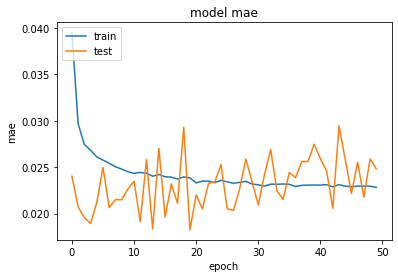

In [62]:
# summarize history for accuracy
plt.plot(hist.history['mae'])
plt.plot(hist.history['val_mae'])
plt.title('model mae')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

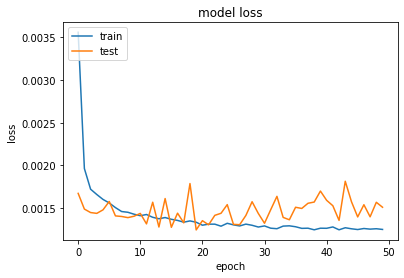

In [63]:
# Above, accuracy increase a lot in the last few epochs. Below, the loss gradually decrease. These are positive signs that our model is doing very good.

# summarize history for loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

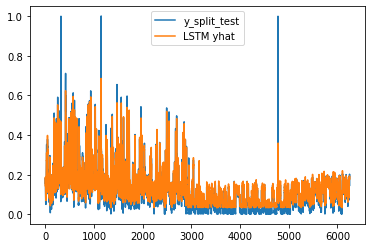

In [64]:
# plot yhat and y_split_test
plt.plot(y_split_test, label='y_split_test')
plt.plot(yhat, label='LSTM yhat')
plt.legend()

# Model Training for Ashok Vihar BiDirectional LSTM

In [66]:
from LSTM_Model import build_bidirectional_lstm_model
from keras.optimizers import Adam

n_steps = 24
n_features = 5
input_shape = (n_steps, n_features)
num_lstm_units = 64
num_dense_units = 50
dense_activation_function = 'tanh'
optimizer = Adam(lr=0.001)

B_model = build_bidirectional_lstm_model(input_shape, num_lstm_units, num_dense_units, dense_activation_function, optimizer)

#  fit model
hist = B_model.fit(X_split_train, y_split_train, validation_data=(X_split_test, y_split_test), epochs=50, verbose = 1)


Epoch 1/50
785/785 [==============================] - 15s 15ms/step - loss: 0.0022 - mae: 0.0301 - val_loss: 0.0016 - val_mae: 0.0200
Epoch 2/50
785/785 [==============================] - 12s 15ms/step - loss: 0.0013 - mae: 0.0219 - val_loss: 0.0015 - val_mae: 0.0183
Epoch 3/50
785/785 [==============================] - 12s 15ms/step - loss: 0.0012 - mae: 0.0211 - val_loss: 0.0014 - val_mae: 0.0183
Epoch 4/50
785/785 [==============================] - 12s 16ms/step - loss: 0.0012 - mae: 0.0214 - val_loss: 0.0014 - val_mae: 0.0177
Epoch 5/50
785/785 [==============================] - 11s 15ms/step - loss: 0.0012 - mae: 0.0206 - val_loss: 0.0014 - val_mae: 0.0194
Epoch 6/50
785/785 [==============================] - 11s 14ms/step - loss: 0.0012 - mae: 0.0207 - val_loss: 0.0014 - val_mae: 0.0191
Epoch 7/50
785/785 [==============================] - 11s 14ms/step - loss: 0.0011 - mae: 0.0205 - val_loss: 0.0014 - val_mae: 0.0197
Epoch 8/50
785/785 [==============================] - 12s 15ms

In [67]:
B_yhat = B_model.predict(X_split_test)
from math import sqrt
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_split_test, B_yhat)
print('MSE: %.5f' % mse)
rmse = sqrt(mse)
print('RMSE: %.5f' % rmse)
# R2 score
r2 = r2_score(y_split_test, B_yhat)
print('R2: %.5f' % r2)

196/196 [==============================] - 1s 5ms/step
MSE: 0.00138
RMSE: 0.03721
R2: 0.88438


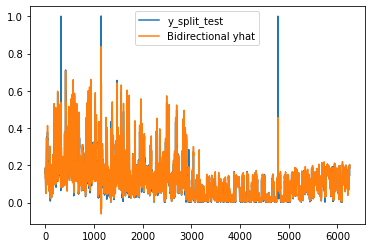

In [68]:
# plot yhat and y_split_test
plt.plot(y_split_test, label='y_split_test')
plt.plot(B_yhat, label='Bidirectional yhat')
plt.legend()

# Model Training for Ashok Vihar ML Models

In [69]:
Xml = aq_df.drop(['O3'], axis=1)
yml = aq_df['O3']
# to array

Xml = Xml.values
yml = yml.values

print(Xml)
print(yml)

[[5.000e+00 5.000e+00 3.000e+00 ... 3.000e+00 2.013e+03 1.000e+00]
 [6.000e+00 6.000e+00 3.000e+00 ... 3.000e+00 2.013e+03 1.000e+00]
 [5.000e+00 1.000e+01 3.000e+00 ... 3.000e+00 2.013e+03 1.000e+00]
 ...
 [9.000e+00 1.400e+01 2.000e+00 ... 2.000e+00 2.017e+03 2.800e+01]
 [1.000e+01 1.200e+01 2.000e+00 ... 2.000e+00 2.017e+03 2.800e+01]
 [1.300e+01 1.600e+01 4.000e+00 ... 2.000e+00 2.017e+03 2.800e+01]]
[ 79.  79.  77. ... 102.  97.  74.]


In [70]:
from sklearn.model_selection import train_test_split
# split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(Xml, yml, test_size=0.3, random_state=0)

# MLR Multivariate Linear Regression Model Training for Ashok Vihar

MSE: 1352.40516
RMSE: 36.77506
R2: 0.53304


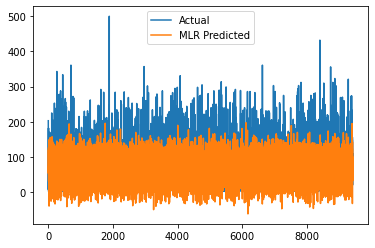

In [71]:
# write the function for the MLR model

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt

def build_mlr_model(X_train, y_train, X_test, y_test):
    model = LinearRegression()
    model.fit(X_train, y_train)
    yhat = model.predict(X_test)
    mse = mean_squared_error(y_test, yhat)
    print('MSE: %.5f' % mse)
    rmse = sqrt(mse)
    print('RMSE: %.5f' % rmse)
    # R2 score
    r2 = r2_score(y_test, yhat)
    print('R2: %.5f' % r2)
    return model, yhat

# build the MLR model
mlr_model, mlr_yhat = build_mlr_model(X_train, y_train, X_test, y_test)

# plot yhat and y_split_test
plt.plot(y_test, label='Actual')
plt.plot(mlr_yhat, label='MLR Predicted')
plt.legend()

# Random Forest Model Training for Ashok Vihar

MSE: 576.74112
RMSE: 24.01544
R2: 0.80086


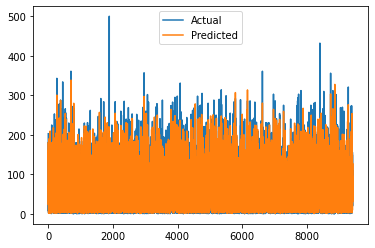

In [72]:

# write the function for the Random Forest model
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt

def build_rf_model(X_train, y_train, X_test, y_test):
    model = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=0)
    model.fit(X_train, y_train)
    yhat = model.predict(X_test)
    mse = mean_squared_error(y_test, yhat)
    print('MSE: %.5f' % mse)
    rmse = sqrt(mse)
    print('RMSE: %.5f' % rmse)
    # R2 score
    r2 = r2_score(y_test, yhat)
    print('R2: %.5f' % r2)
    return model, yhat

# build the Random Forest model
rf_model, rf_yhat = build_rf_model(X_train, y_train, X_test, y_test)

# plot yhat and y_split_test
# plt.figure(figsize=(12, 8))
plt.plot(y_test, label='Actual')
plt.plot(rf_yhat, label='Predicted')
plt.legend()
